In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os


In [3]:
def preprocess_image(image_path):
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    if image is None:
        print(f" Failed to load: {image_path}")
        return None

    # Step 1: Noise reduction
    blurred = cv2.GaussianBlur(image, (5, 5), 0)

    # Step 2: Adaptive thresholding
    thresholded = cv2.adaptiveThreshold(
        blurred, 255,
        cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
        cv2.THRESH_BINARY_INV,
        11, 2
    )

    # Step 3: Morphological cleaning
    kernel = np.ones((3, 3), np.uint8)
    cleaned = cv2.morphologyEx(thresholded, cv2.MORPH_OPEN, kernel)

    return image, cleaned


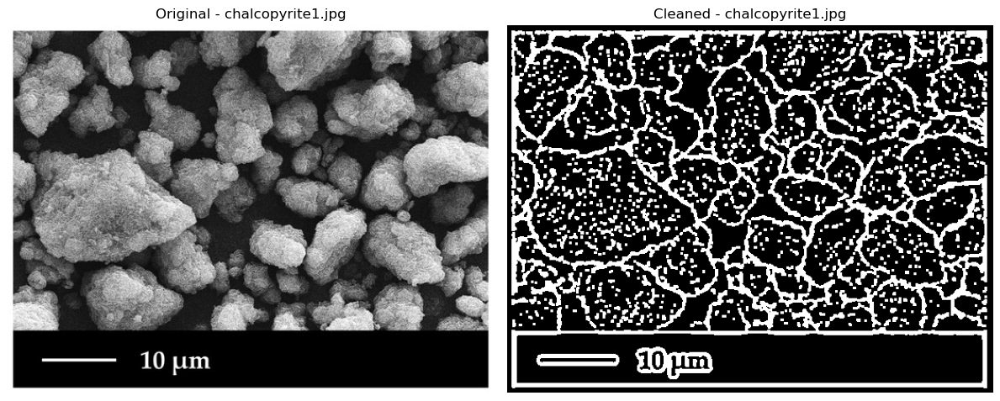

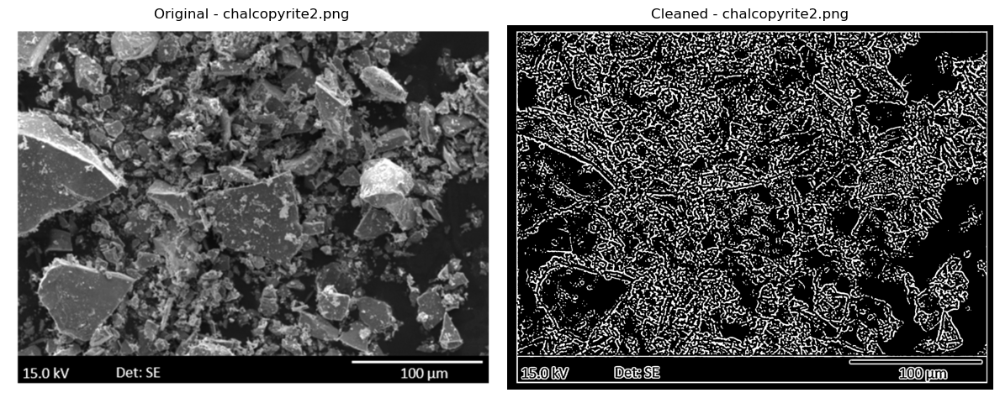

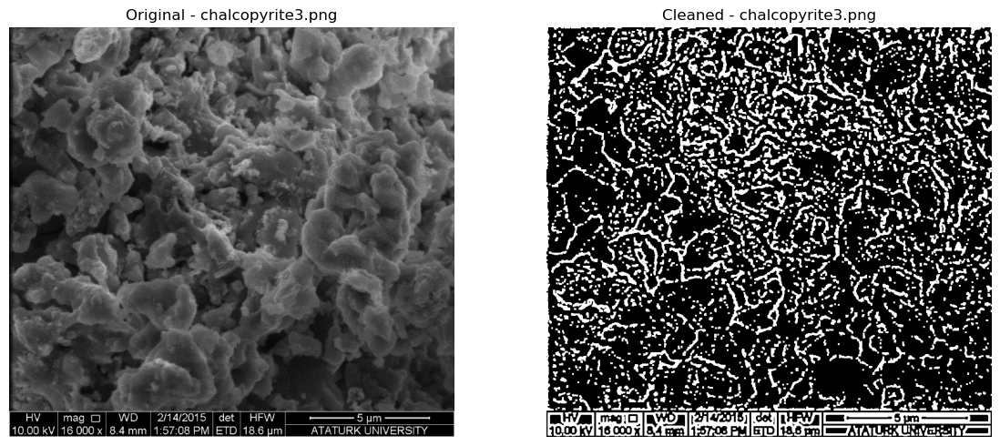

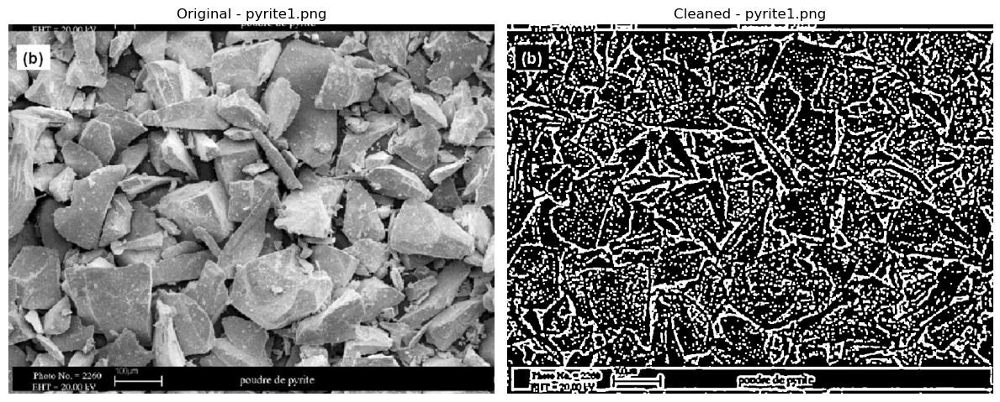

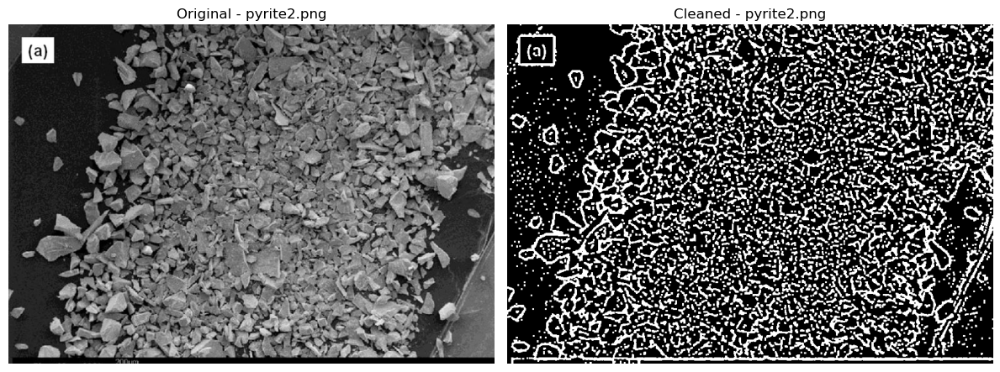

In [9]:
# Directory path
image_dir = 'image/raw/'    
image_files = ['chalcopyrite1.jpg', 'chalcopyrite2.png', 'chalcopyrite3.png', 'pyrite1.png', 'pyrite2.png' ]

for file in image_files:
    path = os.path.join(image_dir, file)
    original, cleaned = preprocess_image(path)

    if cleaned is not None:
        plt.figure(figsize=(12, 5))

        plt.subplot(1, 2, 1)
        plt.imshow(original, cmap='gray')
        plt.title(f'Original - {file}')
        plt.axis('off')

        plt.subplot(1, 2, 2)
        plt.imshow(cleaned, cmap='gray')
        plt.title(f'Cleaned - {file}')
        plt.axis('off')

        plt.tight_layout()
        plt.show()


In [11]:
# Create processed folder if it doesn't exist
processed_dir = 'image/processed/'
os.makedirs(processed_dir, exist_ok=True)


 Saved: image/processed/processed_chalcopyrite1.jpg


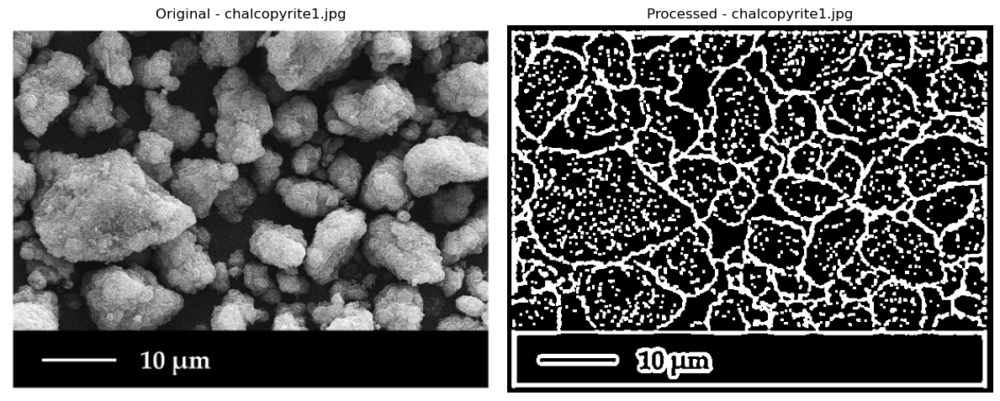

 Saved: image/processed/processed_chalcopyrite2.png


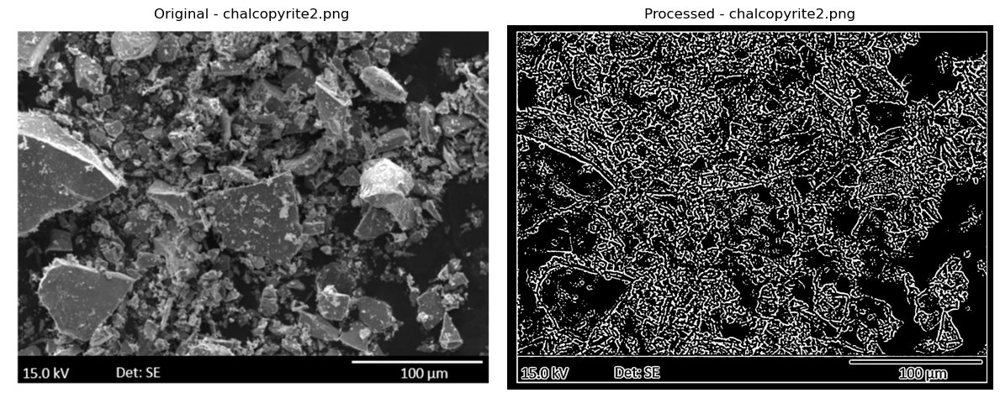

 Saved: image/processed/processed_chalcopyrite3.png


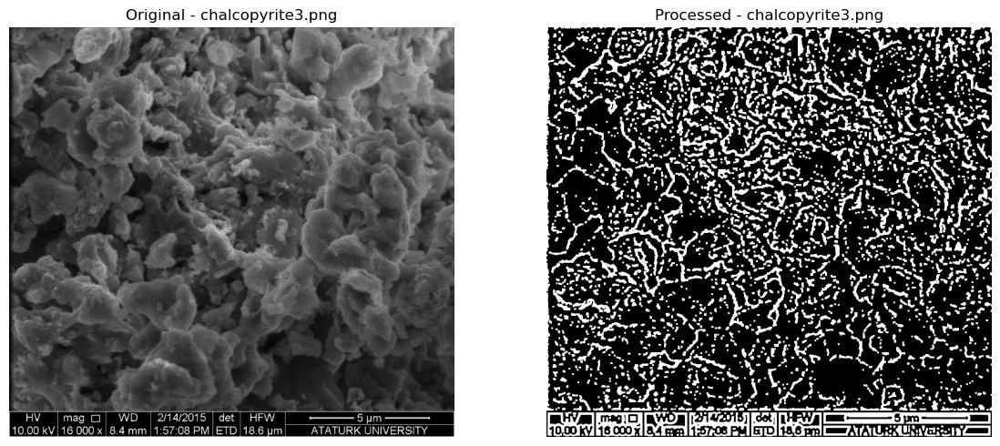

 Saved: image/processed/processed_pyrite1.png


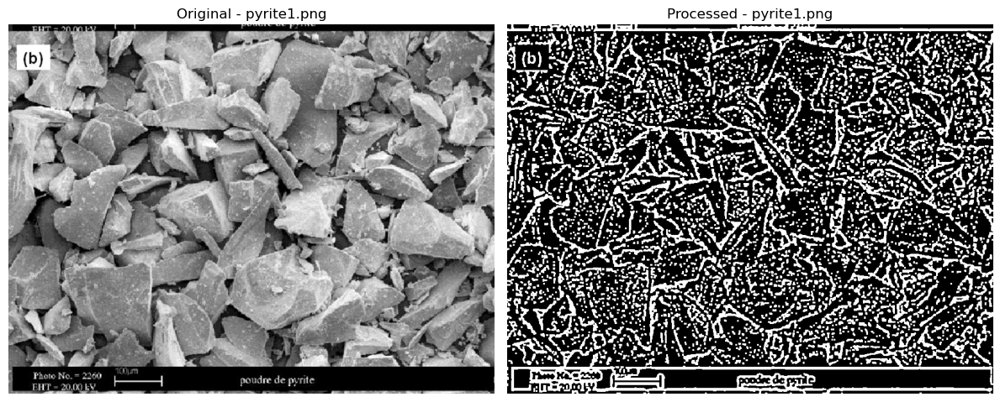

 Saved: image/processed/processed_pyrite2.png


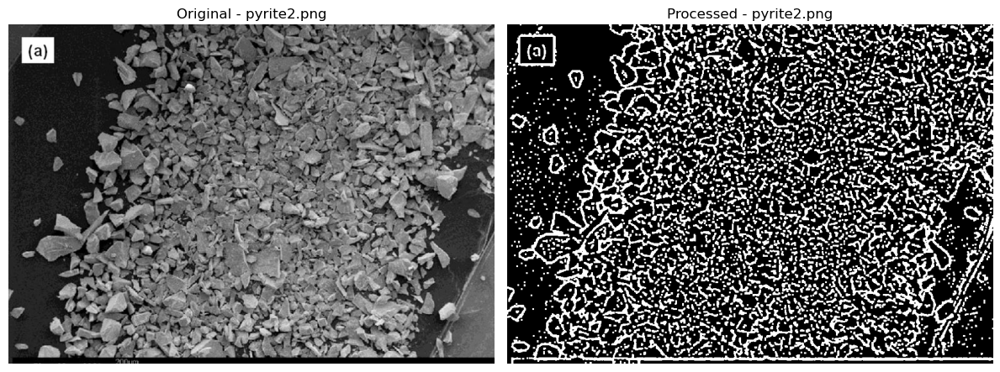

In [15]:
for file in image_files:
    path = os.path.join(image_dir, file)
    original, cleaned = preprocess_image(path)

    if cleaned is not None:
        # Save cleaned image
        save_path = os.path.join(processed_dir, f'processed_{file}')
        cv2.imwrite(save_path, cleaned)
        print(f" Saved: {save_path}")

        # Show images
        plt.figure(figsize=(12, 5))

        plt.subplot(1, 2, 1)
        plt.imshow(original, cmap='gray')
        plt.title(f'Original - {file}')
        plt.axis('off')

        plt.subplot(1, 2, 2)
        plt.imshow(cleaned, cmap='gray')
        plt.title(f'Processed - {file}')
        plt.axis('off')

        plt.tight_layout()
        plt.show()


In [17]:
def analyze_grains(binary_image):
    # Label grains
    num_labels, labels = cv2.connectedComponents(binary_image)

    # Measure total grain area
    grain_area = sum(np.sum(labels == i) for i in range(1, num_labels))  # skip background
    image_area = binary_image.shape[0] * binary_image.shape[1]
    liberation = (grain_area / image_area) * 100

    return num_labels - 1, grain_area, image_area, liberation, labels


 chalcopyrite1.jpg:
  Total Grains: 1076
  Total Grain Area: 105638
  Image Area: 228800
  Liberation %: 46.17%


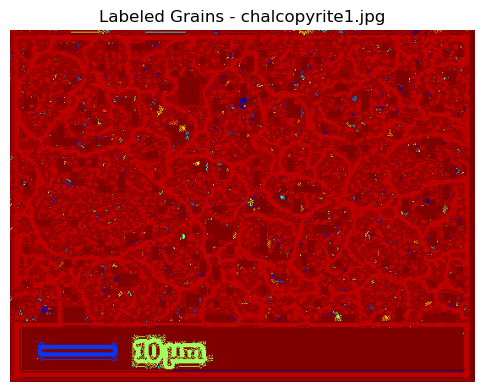

 chalcopyrite2.png:
  Total Grains: 5837
  Total Grain Area: 876433
  Image Area: 4121920
  Liberation %: 21.26%


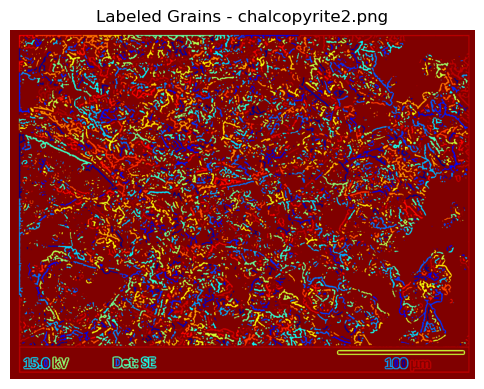

 chalcopyrite3.png:
  Total Grains: 2223
  Total Grain Area: 127014
  Image Area: 512502
  Liberation %: 24.78%


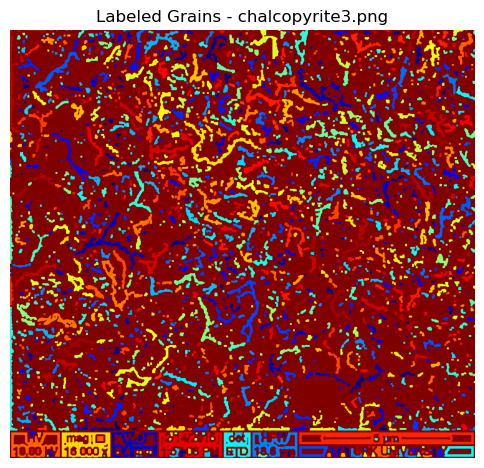

 pyrite1.png:
  Total Grains: 2888
  Total Grain Area: 168731
  Image Area: 549950
  Liberation %: 30.68%


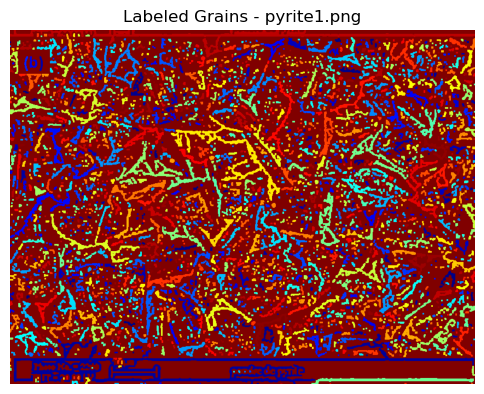

 pyrite2.png:
  Total Grains: 2573
  Total Grain Area: 143481
  Image Area: 504900
  Liberation %: 28.42%


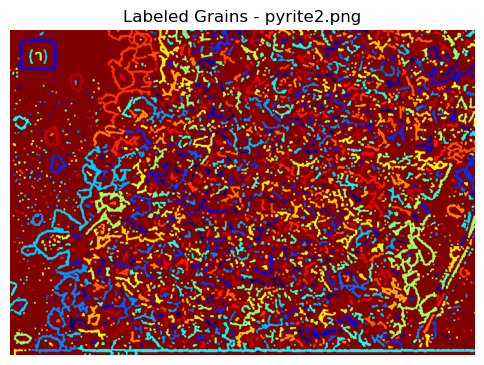

In [19]:
for file in image_files:
    clean_path = os.path.join(processed_dir, f'processed_{file}')
    binary = cv2.imread(clean_path, cv2.IMREAD_GRAYSCALE)

    if binary is not None:
        num_grains, grain_area, img_area, liberation, labels = analyze_grains(binary)

        print(f" {file}:")
        print(f"  Total Grains: {num_grains}")
        print(f"  Total Grain Area: {grain_area}")
        print(f"  Image Area: {img_area}")
        print(f"  Liberation %: {liberation:.2f}%")

        # Show color-labeled grains
        colored = cv2.applyColorMap((labels * 15).astype(np.uint8), cv2.COLORMAP_JET)
        plt.figure(figsize=(6, 6))
        plt.imshow(colored)
        plt.title(f'Labeled Grains - {file}')
        plt.axis('off')
        plt.show()


In [21]:
import pandas as pd

results = []

for file in image_files:
    clean_path = os.path.join(processed_dir, f'processed_{file}')
    binary = cv2.imread(clean_path, cv2.IMREAD_GRAYSCALE)

    if binary is not None:
        num_grains, grain_area, img_area, liberation, labels = analyze_grains(binary)

        results.append({
            'Image': file,
            'Total_Grains': num_grains,
            'Grain_Area': grain_area,
            'Image_Area': img_area,
            'Liberation_Percent': round(liberation, 2)
        })


In [22]:
df = pd.DataFrame(results)
df.to_csv('outputs/grain_analysis_results.csv', index=False)
print(" Grain analysis results saved to outputs/grain_analysis_results.csv")


 Grain analysis results saved to outputs/grain_analysis_results.csv


In [24]:
os.makedirs('outputs/', exist_ok=True)


In [27]:
def get_grain_sizes(labels):
    grain_sizes = []
    for label_id in range(1, np.max(labels) + 1):
        area = np.sum(labels == label_id)
        grain_sizes.append(area)
    return grain_sizes


In [43]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Make sure this exists before you start the loop
output_dir = 'outputs/histograms'
os.makedirs(output_dir, exist_ok=True)

grain_sizes_all = {}

# Loop through all images
image_dir = 'image/raw'
for file in os.listdir(image_dir):
    if file.endswith(('.jpg', '.png', '.jpeg')):
        path = os.path.join(image_dir, file)

        # Load and preprocess image
        image = cv2.imread(path, cv2.IMREAD_GRAYSCALE)
        if image is None:
            print(f"Failed to load: {file}")
            continue

        blurred = cv2.GaussianBlur(image, (5, 5), 0)
        thresholded = cv2.adaptiveThreshold(
            blurred, 255,
            cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
            cv2.THRESH_BINARY_INV, 11, 2
        )
        kernel = np.ones((3, 3), np.uint8)
        cleaned = cv2.morphologyEx(thresholded, cv2.MORPH_OPEN, kernel)

        # Label grains
        num_labels, labels = cv2.connectedComponents(cleaned)

        # Measure areas
        grain_areas = [np.sum(labels == i) for i in range(1, num_labels)]
        grain_areas = [a for a in grain_areas if a > 0]  # filter out noise

        grain_sizes_all[file] = grain_areas

        #  Plot histogram on log scale
        plt.figure(figsize=(6, 4))
        plt.hist(grain_areas, bins=20, color='steelblue', edgecolor='black', log=True)
        plt.title(f'Grain Size Histogram (Log Scale)\n{file}')
        plt.xlabel('Grain Area (pixels)')
        plt.ylabel('Log Frequency')
        plt.grid(True, linestyle='--', alpha=0.5)
        plt.tight_layout()

        # Save histogram
        plt.savefig(os.path.join(output_dir, f'{file}_log_histogram.png'))
        plt.close()






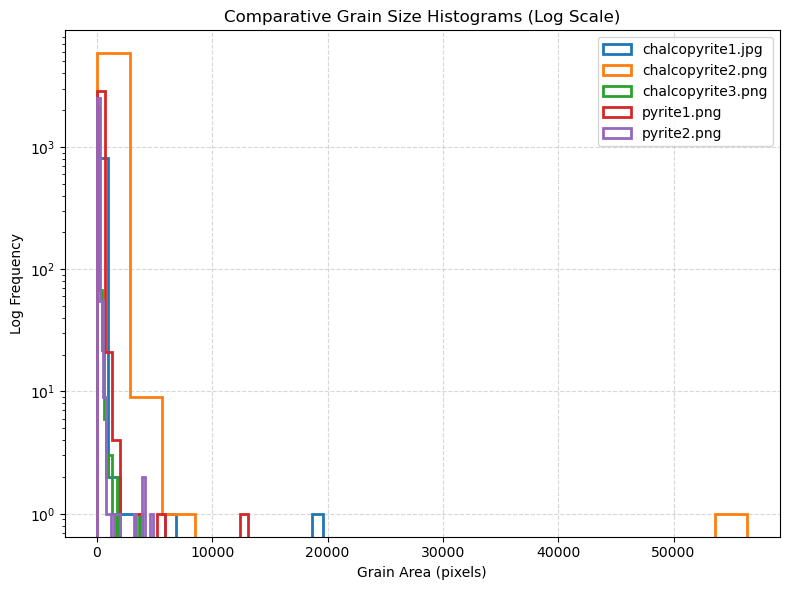

In [45]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Set image directory
image_dir = 'image/raw'  # Adjust path if needed
output_dir = 'outputs/histograms'
os.makedirs(output_dir, exist_ok=True)

# Dictionary to store all grain sizes
grain_sizes_all = {}

# Loop through images
for file in os.listdir(image_dir):
    if file.endswith(('.jpg', '.png', '.jpeg')):
        path = os.path.join(image_dir, file)

        # Load and preprocess
        image = cv2.imread(path, cv2.IMREAD_GRAYSCALE)
        if image is None:
            print(f"Failed to load {file}")
            continue

        blurred = cv2.GaussianBlur(image, (5, 5), 0)
        thresholded = cv2.adaptiveThreshold(
            blurred, 255,
            cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
            cv2.THRESH_BINARY_INV, 11, 2
        )
        kernel = np.ones((3, 3), np.uint8)
        cleaned = cv2.morphologyEx(thresholded, cv2.MORPH_OPEN, kernel)

        # Label grains
        num_labels, labels = cv2.connectedComponents(cleaned)

        # Compute grain areas
        grain_areas = [np.sum(labels == i) for i in range(1, num_labels)]
        grain_areas = [a for a in grain_areas if a > 0]  # Remove zero-size

        grain_sizes_all[file] = grain_areas

        # Plot individual histogram (log scale)
        plt.figure(figsize=(6, 4))
        plt.hist(grain_areas, bins=20, color='teal', edgecolor='black', log=True)
        plt.title(f'Grain Size Histogram (Log Scale): {file}')
        plt.xlabel('Grain Area (pixels)')
        plt.ylabel('Log Frequency')
        plt.grid(True, linestyle='--', alpha=0.5)
        plt.tight_layout()
        plt.savefig(os.path.join(output_dir, f'{file}_log_hist.png'))
        plt.close()

#  Plot combined histogram for all images
plt.figure(figsize=(8, 6))
for file, areas in grain_sizes_all.items():
    plt.hist(areas, bins=20, histtype='step', linewidth=2, label=file, log=True)

plt.title('Comparative Grain Size Histograms (Log Scale)')
plt.xlabel('Grain Area (pixels)')
plt.ylabel('Log Frequency')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.savefig(os.path.join(output_dir, 'combined_log_histogram.png'))
plt.show()


In [47]:
import cv2
import numpy as np
import os
import pandas as pd
import matplotlib.pyplot as plt

# Directories
raw_dir = 'image'
output_dir = 'outputs'
os.makedirs(output_dir, exist_ok=True)

# CSV paths
results_path = os.path.join(output_dir, 'results.csv')
grain_size_path = os.path.join(output_dir, 'grain_sizes.csv')

# Final result storage
summary_results = []
grain_sizes_all = {}

# Helper functions
def preprocess_image(image):
    blurred = cv2.GaussianBlur(image, (5, 5), 0)
    thresh = cv2.adaptiveThreshold(
        blurred, 255,
        cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
        cv2.THRESH_BINARY_INV, 11, 2
    )
    kernel = np.ones((3, 3), np.uint8)
    cleaned = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, kernel)
    return cleaned

def analyze_grains(binary_image):
    num_labels, labels = cv2.connectedComponents(binary_image)
    grain_areas = [np.sum(labels == i) for i in range(1, num_labels)]
    total_grain_area = sum(grain_areas)
    image_area = binary_image.shape[0] * binary_image.shape[1]
    liberation = (total_grain_area / image_area) * 100 if image_area > 0 else 0
    avg_grain_size = np.mean(grain_areas) if grain_areas else 0
    return grain_areas, num_labels - 1, total_grain_area, image_area, liberation, avg_grain_size

# Process each image
for file in os.listdir(raw_dir):
    if file.endswith(('.jpg', '.png')):
        img_path = os.path.join(raw_dir, file)
        image = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)

        if image is not None:
            binary = preprocess_image(image)
            grain_areas, num_grains, grain_area, img_area, liberation, avg_size = analyze_grains(binary)

            summary_results.append({
                'Image': file,
                'Num_Grains': num_grains,
                'Total_Grain_Area': grain_area,
                'Image_Area': img_area,
                'Liberation_Percent': round(liberation, 2),
                'Avg_Grain_Size': round(avg_size, 2)
            })

            # Save grain sizes
            grain_sizes_all[file] = grain_areas

            # Plot histogram
            plt.figure(figsize=(6, 4))
            plt.hist(grain_areas, bins=20, color='steelblue', edgecolor='black')
            plt.title(f'Grain Size Histogram - {file}')
            plt.xlabel('Grain Area (pixels)')
            plt.ylabel('Frequency')
            plt.xlim(0, max(grain_areas) * 1.1)  # tighter range
            plt.grid(True, linestyle='--', alpha=0.5)
            plt.tight_layout()
            plt.savefig(os.path.join(output_dir, f'{file}_histogram.png'))
            plt.close()

# Export Summary CSV
df_summary = pd.DataFrame(summary_results)
df_summary.to_csv(results_path, index=False)

# Export Grain Sizes CSV
df_grains = pd.DataFrame(dict([(k, pd.Series(v)) for k, v in grain_sizes_all.items()]))
df_grains.to_csv(grain_size_path, index=False)

print(f" Results exported to {results_path}")
print(f" Grain sizes exported to {grain_size_path}")


 Results exported to outputs\results.csv
 Grain sizes exported to outputs\grain_sizes.csv


✅ CSV of grain sizes saved to: outputs/grain_size_data.csv


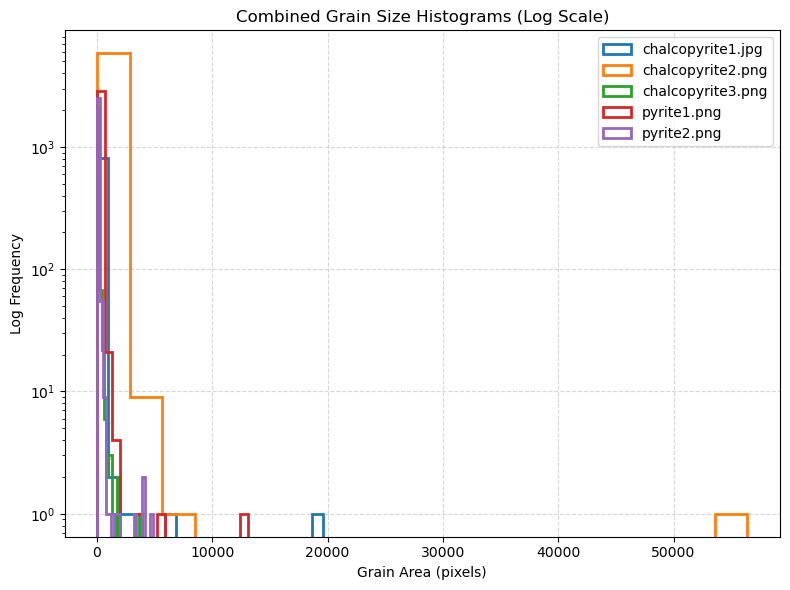

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

# === Setup ===
image_dir = 'image/raw'  # Adjust if needed
output_dir = 'outputs/histograms'
csv_output = 'outputs/grain_size_data.csv'
os.makedirs(output_dir, exist_ok=True)

# === Store grain sizes per image ===
grain_data_dict = {}

# === Process each image ===
for filename in os.listdir(image_dir):
    if filename.endswith(('.jpg', '.png', '.jpeg')):
        filepath = os.path.join(image_dir, filename)

        image = cv2.imread(filepath, cv2.IMREAD_GRAYSCALE)
        if image is None:
            print(f" Failed to load {filename}")
            continue

        blurred = cv2.GaussianBlur(image, (5, 5), 0)
        thresholded = cv2.adaptiveThreshold(
            blurred, 255,
            cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
            cv2.THRESH_BINARY_INV, 11, 2
        )
        kernel = np.ones((3, 3), np.uint8)
        cleaned = cv2.morphologyEx(thresholded, cv2.MORPH_OPEN, kernel)

        # === Label grains ===
        num_labels, labels = cv2.connectedComponents(cleaned)
        grain_areas = [np.sum(labels == i) for i in range(1, num_labels)]
        grain_areas = [a for a in grain_areas if a > 0]

        # === Save individual log-scale histogram ===
        plt.figure(figsize=(6, 4))
        plt.hist(grain_areas, bins=20, color='navy', edgecolor='black', log=True)
        plt.title(f'Grain Size Histogram (Log Scale): {filename}')
        plt.xlabel('Grain Area (pixels)')
        plt.ylabel('Log Frequency')
        plt.grid(True, linestyle='--', alpha=0.6)
        plt.tight_layout()
        plt.savefig(os.path.join(output_dir, f'{filename}_log_hist.png'))
        plt.close()

        # Save grain sizes
        grain_data_dict[filename] = grain_areas

# === Export CSV ===
# Convert to DataFrame with NaN fill for unequal lengths
grain_df = pd.DataFrame(dict([(k, pd.Series(v)) for k, v in grain_data_dict.items()]))
grain_df.to_csv(csv_output, index=False)
print(f" CSV of grain sizes saved to: {csv_output}")

# === Combined histogram (log-scale) ===
plt.figure(figsize=(8, 6))
for filename, areas in grain_data_dict.items():
    plt.hist(areas, bins=20, histtype='step', linewidth=2, label=filename, log=True)

plt.title('Combined Grain Size Histograms (Log Scale)')
plt.xlabel('Grain Area (pixels)')
plt.ylabel('Log Frequency')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.savefig(os.path.join(output_dir, 'combined_log_histogram.png'))
plt.show()
